In [21]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [22]:
%cd /content/drive/MyDrive/cse555_dataset_mthameem_jhe48
%ls

/content/drive/MyDrive/cse555_dataset_mthameem_jhe48
Cauliflower/  Corn/  Ginger/  Plum/


In [56]:
from PIL import ImageFile
ImageFile.LOAD_TRUNCATED_IMAGES = True  # tolerate truncated images

## Data Loading & Preprocessing

In [57]:
import os
import pandas as pd
from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Defining the base directory
base_dir = '/content/drive/MyDrive/cse555_dataset_mthameem_jhe48'
print(f"Attempting to access base directory: {base_dir}")

image_paths = []
produce_types = []
variations = []

# Use os.walk to traverse the directory structure
if os.path.exists(base_dir):
    for root, dirs, files in os.walk(base_dir):
        path_parts = root.split(os.sep)
        try:
            # Find the index of base_dir parts in the root path
            base_dir_parts = base_dir.split(os.sep)
            base_dir_index = -1
            for i, part in enumerate(path_parts):
                if part == base_dir_parts[-1]:
                    base_dir_index = i
                    break

            if base_dir_index != -1 and len(path_parts) > base_dir_index + 2:
                 produce_type = path_parts[base_dir_index + 1]
                 variation = path_parts[base_dir_index + 3]

                 if files:
                     for file in files:
                         # Check for image file extension
                         if file.lower().endswith(('.jpg', '.jpeg', '.png')):
                             image_path = os.path.join(root, file)
                             image_paths.append(image_path)
                             produce_types.append(produce_type)
                             variations.append(variation)
            else:
                pass


        except IndexError:
            continue

    print(f"Successfully processed directory: {base_dir}")
else:
    print(f"Error: Directory not found at {base_dir}")

# Debug print to check if any images were found
print(f"Found {len(image_paths)} images.")

Attempting to access base directory: /content/drive/MyDrive/cse555_dataset_mthameem_jhe48
Successfully processed directory: /content/drive/MyDrive/cse555_dataset_mthameem_jhe48
Found 12000 images.


In [58]:
# Defining image size and batch size
img_width, img_height = 150, 150
batch_size = 32

In [59]:
from PIL import Image
from tqdm.auto import tqdm # Import tqdm

def find_corrupted_images(image_paths):
    """Checks a list of image paths for corrupted files."""
    corrupted_files = []
    print("Checking for corrupted images...")
    for img_path in tqdm(image_paths, desc="Checking Images"):
        try:
            img = Image.open(img_path)
            img.verify()
        except (IOError, SyntaxError, OSError) as e:
            corrupted_files.append(img_path)
    print(f"Finished checking {len(image_paths)} images.")
    return corrupted_files

if 'image_paths' in locals() and image_paths:
    corrupted_images = find_corrupted_images(image_paths)

    if corrupted_images:
        print(f"\nFound {len(corrupted_images)} corrupted image files:")
        for corrupted_file in corrupted_images:
            print(corrupted_file)
        print("\nPlease address these corrupted files in your dataset.")
    else:
        print("\nNo corrupted images found.")
else:
    print("Variable 'image_paths' not found or is empty. Please run the data loading cell first.")

Checking for corrupted images...


Checking Images:   0%|          | 0/12000 [00:00<?, ?it/s]

Finished checking 12000 images.

No corrupted images found.


In [65]:
# Creating a pandas DataFrame
df = pd.DataFrame({
    'image_path': image_paths,
    'produce_type': produce_types,
    'variation': variations
    })

unique_produce_types = df['produce_type'].unique()
unique_variations = df['variation'].unique()

print(f"Unique Produce Types: {unique_produce_types}")
print(f"Unique Variations: {unique_variations}")
print(f"Total images loaded: {len(df)}")

if not df.empty:
  df['combined_label'] = df['produce_type'] + '_' + df['variation']
  # Modified for 80:10:10 split (80% train, 20% temp)
  train_df, temp_df = train_test_split(df, test_size=0.2, random_state=42, stratify=df['combined_label'])

  # Split temp_df (20%) into validation (10%) and test (10%)
  val_df, test_df = train_test_split(temp_df, test_size=0.5, random_state=42, stratify=temp_df['combined_label'])

  print(f"Training set size: {len(train_df)}")
  print(f"Validation set size: {len(val_df)}")
  print(f"Test set size: {len(test_df)}")

img_width, img_height = 150, 150 # Define a consistent image size
batch_size = 32 # Define batch size

train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
    )

val_test_datagen = ImageDataGenerator(rescale=1./255)

# Custom function to load images and handle errors
def load_img_with_error_handling(path, target_size):
    try:
        img = image.load_img(path, target_size=target_size)
        return image.img_to_array(img)
    except (IOError, SyntaxError, OSError) as e:
        print(f"Skipping corrupted or truncated image: {path} - {e}")
        return None # Return None for corrupted images

Unique Produce Types: ['Cauliflower' 'Plum' 'Corn' 'Ginger']
Unique Variations: ['Florets' 'Riced (or) Steaked' 'Whole Head' 'In a Bowl'
 'Halved (or) Pitted' 'Whole' 'Kernels' 'Un-Husked' 'Husked'
 'Minced-Sliced' 'Whole-Hand' 'Broken-Peeled']
Total images loaded: 12000
Training set size: 9600
Validation set size: 1200
Test set size: 1200


In [66]:
# Configuring the data generators
all_produce_types = sorted(df['produce_type'].unique())
all_variations = sorted(df['variation'].unique())

train_generator = train_datagen.flow_from_dataframe(
    dataframe=train_df,
    x_col='image_path',
    y_col=['produce_type', 'variation'],
    target_size=(img_width, img_height),
    batch_size=batch_size,
    class_mode='multi_output', # Output multiple labels
    classes={'produce_type': all_produce_types, 'variation': all_variations},
    workers=4,
    use_multiprocessing=True
    )

validation_generator = val_test_datagen.flow_from_dataframe (
    dataframe=val_df,
    x_col='image_path',
    y_col=['produce_type', 'variation'],
    target_size=(img_width, img_height),
    batch_size=batch_size,
    class_mode='multi_output',
    classes={'produce_type': all_produce_types, 'variation': all_variations},
    workers=4,
    use_multiprocessing=True
)

test_generator = val_test_datagen.flow_from_dataframe(
    dataframe=test_df,
    x_col='image_path',
    y_col=['produce_type', 'variation'],
    target_size=(img_width, img_height),
    batch_size=batch_size,
    class_mode='multi_output',
    shuffle=False, # Keep order for evaluation
    classes={'produce_type': all_produce_types, 'variation': all_variations}, # Explicitly define classes
    # Add workers and multiprocessing for faster data loading
    workers=4,
    use_multiprocessing=True
    )

/usr/local/lib/python3.11/dist-packages/keras/src/legacy/preprocessing/image.py:854: UserWarning: `classes` will be ignored given the class_mode="multi_output"
  warnings.warn(


Found 9600 validated image filenames.
Found 1200 validated image filenames.
Found 1200 validated image filenames.


## Produce Classification

### Model Development

In [67]:
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
import numpy as np
import pandas as pd

In [68]:
# Defining image size and batch size
img_width, img_height = 150, 150
batch_size = 32

# Get unique produce types from the loaded dataframe to define classes
unique_produce_types = sorted(df['produce_type'].unique())
num_produce_classes = len(unique_produce_types)

print(f"Number of produce classes to classify: {num_produce_classes}")
print(f"Produce classes: {unique_produce_types}")

# Creating data generators for produce type classification
# y_col should be 'produce_type' and class_mode should be 'categorical'

train_generator_produce_type = train_datagen.flow_from_dataframe(
    dataframe=train_df,
    directory=None,
    x_col='image_path',
    y_col='produce_type', # Classify based on produce type
    target_size=(img_width, img_height),
    batch_size=batch_size,
    class_mode='categorical', # For multi-class classification (4 produce types)
    classes=unique_produce_types, # Explicitly define the 4 classes
    # Add workers and multiprocessing for faster data loading
    workers=4,
    use_multiprocessing=True
)

validation_generator_produce_type = val_test_datagen.flow_from_dataframe(
    dataframe=val_df, # Use the full validation dataframe
    directory=None,
    x_col='image_path',
    y_col='produce_type',
    target_size=(img_width, img_height),
    batch_size=batch_size,
    class_mode='categorical',
    classes=unique_produce_types,
    # Add workers and multiprocessing for faster data loading
    workers=4,
    use_multiprocessing=True
)

test_generator_produce_type = val_test_datagen.flow_from_dataframe(
    dataframe=test_df, # Use the full test dataframe
    directory=None,
    x_col='image_path',
    y_col='produce_type',
    target_size=(img_width, img_height),
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=False, # Keep order for evaluation
    classes=unique_produce_types,
    # Add workers and multiprocessing for faster data loading
    workers=4,
    use_multiprocessing=True
)

# Load pre-trained base model
base_model = tf.keras.applications.ResNet50(weights='imagenet', include_top=False, input_shape=(img_width, img_height, 3))

# Freeze the base model layers
base_model.trainable = False

# Add custom classification layers for produce type classification
x = base_model.output
x = tf.keras.layers.GlobalAveragePooling2D()(x)
x = tf.keras.layers.Dense(128, activation='relu')(x) # Add a dense layer
predictions = tf.keras.layers.Dense(num_produce_classes, activation='softmax')(x) # Final layer for produce type classification (4 units)

Number of produce classes to classify: 4
Produce classes: ['Cauliflower', 'Corn', 'Ginger', 'Plum']
Found 9600 validated image filenames belonging to 4 classes.
Found 1200 validated image filenames belonging to 4 classes.
Found 1200 validated image filenames belonging to 4 classes.


In [69]:
# Create the model
produce_type_model = tf.keras.models.Model(inputs=base_model.input, outputs=predictions)

# Compile the model
produce_type_model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# Define callbacks
checkpoint_filepath = '/tmp/best_produce_type_model.h5'
model_checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath=checkpoint_filepath,
    save_best_only=True,
    monitor='val_accuracy',
    mode='max'
)

early_stopping_callback = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss',
    patience=5, # Number of epochs with no improvement after which training will be stopped.
    restore_best_weights=True # Restore model weights from the epoch with the best value of the monitored quantity.
)

print(f"Training model for produce type classification ({num_produce_classes} classes)...")
# Train the model
produce_type_history = produce_type_model.fit(
    train_generator_produce_type,
    steps_per_epoch=train_generator_produce_type.samples // batch_size,
    epochs=8, # Train for a suitable number of epochs
    validation_data=validation_generator_produce_type,
    validation_steps=validation_generator_produce_type.samples // batch_size,
    callbacks=[model_checkpoint_callback, early_stopping_callback]
)

# Load the best model saved by ModelCheckpoint
best_produce_type_model = tf.keras.models.load_model(checkpoint_filepath)

Training model for produce type classification (4 classes)...


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/8
300/300 ━━━━━━━━━━━━━━━━━━━━ 0s 20s/step - accuracy: 0.3312 - loss: 1.3423 

/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


300/300 ━━━━━━━━━━━━━━━━━━━━ 6507s 22s/step - accuracy: 0.3313 - loss: 1.3421 - val_accuracy: 0.4552 - val_loss: 1.1727
Epoch 2/8
300/300 ━━━━━━━━━━━━━━━━━━━━ 0s 8s/step - accuracy: 0.4343 - loss: 1.2122

300/300 ━━━━━━━━━━━━━━━━━━━━ 2929s 10s/step - accuracy: 0.4343 - loss: 1.2121 - val_accuracy: 0.5253 - val_loss: 1.0867
Epoch 3/8
300/300 ━━━━━━━━━━━━━━━━━━━━ 2910s 10s/step - accuracy: 0.4542 - loss: 1.1728 - val_accuracy: 0.4797 - val_loss: 1.1157
Epoch 4/8
300/300 ━━━━━━━━━━━━━━━━━━━━ 2994s 10s/step - accuracy: 0.4731 - loss: 1.1388 - val_accuracy: 0.4975 - val_loss: 1.0583
Epoch 5/8
300/300 ━━━━━━━━━━━━━━━━━━━━ 2945s 10s/step - accuracy: 0.4934 - loss: 1.1065 - val_accuracy: 0.4823 - val_loss: 1.1128
Epoch 6/8
300/300 ━━━━━━━━━━━━━━━━━━━━ 0s 8s/step - accuracy: 0.5084 - loss: 1.0793

300/300 ━━━━━━━━━━━━━━━━━━━━ 2925s 10s/step - accuracy: 0.5084 - loss: 1.0793 - val_accuracy: 0.5422 - val_loss: 0.9863
Epoch 7/8
300/300 ━━━━━━━━━━━━━━━━━━━━ 2951s 10s/step - accuracy: 0.5222 - loss: 1.0623 - val_accuracy: 0.5389 - val_loss: 1.0109
Epoch 8/8
300/300 ━━━━━━━━━━━━━━━━━━━━ 0s 8s/step - accuracy: 0.5318 - loss: 1.0328

300/300 ━━━━━━━━━━━━━━━━━━━━ 2963s 10s/step - accuracy: 0.5318 - loss: 1.0329 - val_accuracy: 0.5507 - val_loss: 1.0056


### Model Evaluation

In [70]:
from sklearn.metrics import classification_report, confusion_matrix
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

In [96]:
# Check if the produce type model exists
if 'produce_type_model' in locals():
    model = produce_type_model
    print(f"Evaluating the single produce type classification model")

    unique_produce_types = sorted(df['produce_type'].unique())

    test_generator_produce_type = val_test_datagen.flow_from_dataframe(
        dataframe=test_df, # Use the full test dataframe
        directory=None,
        x_col='image_path',
        y_col='produce_type', # Classify based on produce type
        target_size=(img_width, img_height),
        batch_size=batch_size,
        class_mode='categorical',
        shuffle=False, # Keep order for evaluation
        classes=unique_produce_types # Explicitly define the 4 classes
    )
else:
    print("Produce type model not found. Please train the model first.")

Evaluating the single produce type classification model
Found 1200 validated image filenames belonging to 4 classes.


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


38/38 ━━━━━━━━━━━━━━━━━━━━ 203s 5s/step

Classification Report for Produce Type Classification:
              precision    recall  f1-score   support

 Cauliflower       0.65      0.67      0.66       300
        Corn       0.61      0.42      0.50       300
      Ginger       0.47      0.85      0.60       300
        Plum       0.63      0.30      0.41       300

    accuracy                           0.56      1200
   macro avg       0.59      0.56      0.54      1200
weighted avg       0.59      0.56      0.54      1200



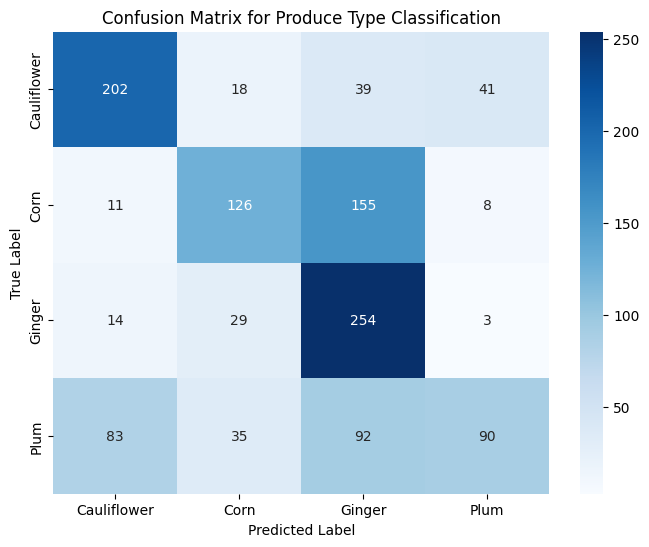

In [97]:
# Predict probabilities for the test set
y_pred_probs = model.predict(test_generator_produce_type)

# Convert probabilities to class indices
y_pred = np.argmax(y_pred_probs, axis=1)

# Get true labels from the test generator
y_true = test_generator_produce_type.classes

# Get the class names in the order they appear in the generator
target_names = list(test_generator_produce_type.class_indices.keys())

# Print classification report
print(f"\nClassification Report for Produce Type Classification:")
print(classification_report(y_true, y_pred, target_names=target_names))

# Generate and plot confusion matrix
cm = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=target_names,
            yticklabels=target_names)

plt.title(f'Confusion Matrix for Produce Type Classification')
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.show()

In [98]:
from sklearn.metrics import classification_report
import pandas as pd

# --- Display Metrics for Overall Produce Type Classification ---
print("--- Final Evaluation Metrics for Overall Produce Type Classification ---")

# Assuming y_true, y_pred, and target_names are available from cell ggP5QldIuH_o
if 'y_true' in locals() and 'y_pred' in locals() and 'target_names' in locals():
    print("\nClassification Report:")
    report = classification_report(y_true, y_pred, target_names=target_names, output_dict=True)
    report_df = pd.DataFrame(report).transpose()
    print(report_df)
else:
    print("Variables y_true, y_pred, or target_names not found for produce type classification.")

print("\n--- Final Evaluation Metrics for Variation Classification per Produce Type ---")

if 'variation_models' in locals() and variation_models and 'test_df' in locals() and 'val_test_datagen' in locals():
    for produce_type, model in variation_models.items():
        print(f"\nMetrics for Variation Classification for: {produce_type}")

        test_df_filtered = test_df[test_df['produce_type'] == produce_type]

        if test_df_filtered.empty:
            print(f" No test data available for {produce_type} variations.")
            continue

        produce_variations = sorted(test_df_filtered['variation'].unique())
        try:
            test_generator_variation = val_test_datagen.flow_from_dataframe(
                dataframe=test_df_filtered,
                directory=None,
                x_col='image_path',
                y_col='variation',
                target_size=(img_width, img_height),
                batch_size=batch_size,
                class_mode='categorical',
                shuffle=False,
                classes=produce_variations
            )

            # Predict and get true labels
            y_pred_probs_variation = model.predict(test_generator_variation)
            y_pred_variation = np.argmax(y_pred_probs_variation, axis=1)
            y_true_variation = test_generator_variation.classes
            variation_target_names = list(test_generator_variation.class_indices.keys())


            print(" Classification Report:")
            report_variation = classification_report(y_true_variation, y_pred_variation, target_names=variation_target_names, output_dict=True)
            report_variation_df = pd.DataFrame(report_variation).transpose()
            print(report_variation_df)

        except Exception as e:
            print(f" Error generating metrics for {produce_type} variations: {e}")

--- Final Evaluation Metrics for Overall Produce Type Classification ---

Classification Report:
              precision    recall  f1-score  support
Cauliflower    0.651613  0.673333  0.662295   300.00
Corn           0.605769  0.420000  0.496063   300.00
Ginger         0.470370  0.846667  0.604762   300.00
Plum           0.633803  0.300000  0.407240   300.00
accuracy       0.560000  0.560000  0.560000     0.56
macro avg      0.590389  0.560000  0.542590  1200.00
weighted avg   0.590389  0.560000  0.542590  1200.00

--- Final Evaluation Metrics for Variation Classification per Produce Type ---

Metrics for Variation Classification for: Cauliflower
Found 300 validated image filenames belonging to 3 classes.


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


10/10 ━━━━━━━━━━━━━━━━━━━━ 77s 8s/step
 Classification Report:
                    precision    recall  f1-score     support
Florets              0.605263  0.230000  0.333333  100.000000
Riced (or) Steaked   0.738739  0.820000  0.777251  100.000000
Whole Head           0.589404  0.890000  0.709163  100.000000
accuracy             0.646667  0.646667  0.646667    0.646667
macro avg            0.644469  0.646667  0.606583  300.000000
weighted avg         0.644469  0.646667  0.606583  300.000000

Metrics for Variation Classification for: Plum
Found 300 validated image filenames belonging to 3 classes.


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


10/10 ━━━━━━━━━━━━━━━━━━━━ 79s 8s/step
 Classification Report:
                    precision    recall  f1-score     support
Halved (or) Pitted   0.651163  0.560000  0.602151  100.000000
In a Bowl            0.629921  0.800000  0.704846  100.000000
Whole                0.551724  0.480000  0.513369  100.000000
accuracy             0.613333  0.613333  0.613333    0.613333
macro avg            0.610936  0.613333  0.606788  300.000000
weighted avg         0.610936  0.613333  0.606788  300.000000

Metrics for Variation Classification for: Corn
Found 300 validated image filenames belonging to 3 classes.


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


10/10 ━━━━━━━━━━━━━━━━━━━━ 25s 2s/step
 Classification Report:
              precision    recall  f1-score     support
Husked         0.557522  0.630000  0.591549  100.000000
Kernels        0.681319  0.620000  0.649215  100.000000
Un-Husked      0.687500  0.660000  0.673469  100.000000
accuracy       0.636667  0.636667  0.636667    0.636667
macro avg      0.642114  0.636667  0.638078  300.000000
weighted avg   0.642114  0.636667  0.638078  300.000000

Metrics for Variation Classification for: Ginger
Found 300 validated image filenames belonging to 3 classes.


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


10/10 ━━━━━━━━━━━━━━━━━━━━ 23s 2s/step
 Classification Report:
               precision    recall  f1-score     support
Broken-Peeled   0.505882  0.430000  0.464865  100.000000
Minced-Sliced   0.556522  0.640000  0.595349  100.000000
Whole-Hand      0.630000  0.630000  0.630000  100.000000
accuracy        0.566667  0.566667  0.566667    0.566667
macro avg       0.564135  0.566667  0.563405  300.000000
weighted avg    0.564135  0.566667  0.563405  300.000000


## Variation Classification

### Model Development

In [73]:
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.applications import ResNet50 # Using ResNet50
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
import numpy as np
import pandas as pd

In [ ]:
# Define image size and batch size (should match previous definitions)
img_width, img_height = 150, 150
batch_size = 32

# Get unique produce types from the loaded dataframe
unique_produce_types = df['produce_type'].unique()

# Create a dictionary to store the variation models
variation_models = {}

for produce_type in unique_produce_types:
  print(f"Developing and training variation model for produce type: {produce_type}")

  # Filter dataframes for the current produce type
  train_df_filtered = train_df[train_df['produce_type'] == produce_type].copy()
  val_df_filtered = val_df[val_df['produce_type'] == produce_type].copy()

  produce_variations = sorted(train_df_filtered['variation'].unique())
  num_classes = len(produce_variations)

  train_generator_variation = train_datagen.flow_from_dataframe(
      dataframe=train_df_filtered,
      directory=None, # image_path is absolute
      x_col='image_path',
      y_col='variation',
      target_size=(img_width, img_height),
      batch_size=batch_size,
      class_mode='categorical',
      classes=list(produce_variations) # Ensure consistent class order
      )

  validation_generator_variation = val_test_datagen.flow_from_dataframe(
      dataframe=val_df_filtered,
      directory=None,
      x_col='image_path',
      y_col='variation',
      target_size=(img_width, img_height),
      batch_size=batch_size,
      class_mode='categorical',
      classes=list(produce_variations) # Ensure consistent class order
      )

  # Load pre-trained base model (e.g., ResNet50)
  base_model = tf.keras.applications.ResNet50(weights='imagenet', include_top=False, input_shape=(img_width, img_height, 3))

  # Freeze the base model layers
  base_model.trainable = False

  # Add custom classification layers for variation classification
  x = base_model.output
  x = tf.keras.layers.GlobalAveragePooling2D()(x)

  # You can add more dense layers if needed, similar to produce classification
  x = tf.keras.layers.Dense(128, activation='relu')(x)
  predictions = tf.keras.layers.Dense(num_classes, activation='softmax')(x)

In [74]:
# Create the model
  model = tf.keras.models.Model(inputs=base_model.input, outputs=predictions)

  # Compile the model using the same loss and metrics as produce classification
  model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001), loss='categorical_crossentropy', metrics=['accuracy'])

  # Define callbacks
  checkpoint_filepath = f'/tmp/best_variation_model_{produce_type}.h5'
  model_checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
      filepath=checkpoint_filepath,
      save_best_only=True,
      monitor='val_accuracy',
      mode='max'
      )

  early_stopping_callback = tf.keras.callbacks.EarlyStopping(
      monitor='val_loss',
      patience=5,
      restore_best_weights=True
      )

  print(f"Training variation model for {produce_type}...")

  # Train the model
  history = model.fit(
      train_generator_variation,
      steps_per_epoch=train_generator_variation.samples // batch_size,
      epochs=8, # Train for a suitable number of epochs
      validation_data=validation_generator_variation,
      validation_steps=validation_generator_variation.samples // batch_size,
      callbacks=[model_checkpoint_callback, early_stopping_callback]
      )

  # Load the best model saved by ModelCheckpoint (optional, but good practice)
  best_model = tf.keras.models.load_model(checkpoint_filepath)
  print(f"Finished training variation model for {produce_type}")

  # Store the trained model in the dictionary
  variation_models[produce_type] = best_model

Developing and training variation model for produce type: Cauliflower
Found 2400 validated image filenames belonging to 3 classes.
Found 300 validated image filenames belonging to 3 classes.
Training variation model for Cauliflower...


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/8
75/75 ━━━━━━━━━━━━━━━━━━━━ 0s 11s/step - accuracy: 0.4249 - loss: 1.0890 

75/75 ━━━━━━━━━━━━━━━━━━━━ 918s 12s/step - accuracy: 0.4258 - loss: 1.0883 - val_accuracy: 0.5868 - val_loss: 0.8867
Epoch 2/8
75/75 ━━━━━━━━━━━━━━━━━━━━ 713s 10s/step - accuracy: 0.5659 - loss: 0.9276 - val_accuracy: 0.5243 - val_loss: 0.9026
Epoch 3/8
75/75 ━━━━━━━━━━━━━━━━━━━━ 0s 9s/step - accuracy: 0.5825 - loss: 0.8546

75/75 ━━━━━━━━━━━━━━━━━━━━ 726s 10s/step - accuracy: 0.5826 - loss: 0.8544 - val_accuracy: 0.6076 - val_loss: 0.7715
Epoch 4/8
75/75 ━━━━━━━━━━━━━━━━━━━━ 0s 8s/step - accuracy: 0.6231 - loss: 0.8072

75/75 ━━━━━━━━━━━━━━━━━━━━ 698s 9s/step - accuracy: 0.6228 - loss: 0.8073 - val_accuracy: 0.6528 - val_loss: 0.7687
Epoch 5/8
75/75 ━━━━━━━━━━━━━━━━━━━━ 715s 10s/step - accuracy: 0.6041 - loss: 0.8016 - val_accuracy: 0.6146 - val_loss: 0.7821
Epoch 6/8
75/75 ━━━━━━━━━━━━━━━━━━━━ 706s 9s/step - accuracy: 0.6221 - loss: 0.7795 - val_accuracy: 0.6319 - val_loss: 0.7199
Epoch 7/8
75/75 ━━━━━━━━━━━━━━━━━━━━ 714s 10s/step - accuracy: 0.6338 - loss: 0.7695 - val_accuracy: 0.6146 - val_loss: 0.7241
Epoch 8/8
75/75 ━━━━━━━━━━━━━━━━━━━━ 724s 10s/step - accuracy: 0.6558 - loss: 0.7377 - val_accuracy: 0.5764 - val_loss: 0.7535


Finished training variation model for Cauliflower
Developing and training variation model for produce type: Plum
Found 2400 validated image filenames belonging to 3 classes.
Found 300 validated image filenames belonging to 3 classes.
Training variation model for Plum...


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/8
75/75 ━━━━━━━━━━━━━━━━━━━━ 0s 13s/step - accuracy: 0.3645 - loss: 1.0986 

75/75 ━━━━━━━━━━━━━━━━━━━━ 1078s 14s/step - accuracy: 0.3652 - loss: 1.0982 - val_accuracy: 0.5104 - val_loss: 0.9615
Epoch 2/8
75/75 ━━━━━━━━━━━━━━━━━━━━ 0s 8s/step - accuracy: 0.5098 - loss: 0.9923

75/75 ━━━━━━━━━━━━━━━━━━━━ 705s 9s/step - accuracy: 0.5099 - loss: 0.9921 - val_accuracy: 0.5278 - val_loss: 0.9253
Epoch 3/8
75/75 ━━━━━━━━━━━━━━━━━━━━ 0s 9s/step - accuracy: 0.5136 - loss: 0.9619

75/75 ━━━━━━━━━━━━━━━━━━━━ 725s 10s/step - accuracy: 0.5138 - loss: 0.9617 - val_accuracy: 0.5660 - val_loss: 0.8667
Epoch 4/8
75/75 ━━━━━━━━━━━━━━━━━━━━ 0s 9s/step - accuracy: 0.5424 - loss: 0.9267

75/75 ━━━━━━━━━━━━━━━━━━━━ 727s 10s/step - accuracy: 0.5425 - loss: 0.9266 - val_accuracy: 0.6424 - val_loss: 0.8090
Epoch 5/8
75/75 ━━━━━━━━━━━━━━━━━━━━ 739s 10s/step - accuracy: 0.5743 - loss: 0.9007 - val_accuracy: 0.5694 - val_loss: 0.8903
Epoch 6/8
75/75 ━━━━━━━━━━━━━━━━━━━━ 0s 9s/step - accuracy: 0.5718 - loss: 0.9009

75/75 ━━━━━━━━━━━━━━━━━━━━ 743s 10s/step - accuracy: 0.5719 - loss: 0.9006 - val_accuracy: 0.6528 - val_loss: 0.8023
Epoch 7/8
75/75 ━━━━━━━━━━━━━━━━━━━━ 727s 10s/step - accuracy: 0.5704 - loss: 0.8942 - val_accuracy: 0.6458 - val_loss: 0.8159
Epoch 8/8
75/75 ━━━━━━━━━━━━━━━━━━━━ 744s 10s/step - accuracy: 0.6011 - loss: 0.8665 - val_accuracy: 0.6076 - val_loss: 0.8368


Finished training variation model for Plum
Developing and training variation model for produce type: Corn
Found 2400 validated image filenames belonging to 3 classes.
Found 300 validated image filenames belonging to 3 classes.
Training variation model for Corn...


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/8
75/75 ━━━━━━━━━━━━━━━━━━━━ 0s 9s/step - accuracy: 0.3691 - loss: 1.1125

75/75 ━━━━━━━━━━━━━━━━━━━━ 781s 10s/step - accuracy: 0.3696 - loss: 1.1120 - val_accuracy: 0.3576 - val_loss: 1.0630
Epoch 2/8
75/75 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.4722 - loss: 1.0335

75/75 ━━━━━━━━━━━━━━━━━━━━ 236s 3s/step - accuracy: 0.4722 - loss: 1.0336 - val_accuracy: 0.5451 - val_loss: 0.9956
Epoch 3/8
75/75 ━━━━━━━━━━━━━━━━━━━━ 233s 3s/step - accuracy: 0.4854 - loss: 1.0190 - val_accuracy: 0.5347 - val_loss: 0.9982
Epoch 4/8
75/75 ━━━━━━━━━━━━━━━━━━━━ 242s 3s/step - accuracy: 0.5335 - loss: 0.9855 - val_accuracy: 0.5417 - val_loss: 0.9425
Epoch 5/8
75/75 ━━━━━━━━━━━━━━━━━━━━ 231s 3s/step - accuracy: 0.5381 - loss: 0.9707 - val_accuracy: 0.5104 - val_loss: 0.9528
Epoch 6/8
75/75 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.5748 - loss: 0.9373

75/75 ━━━━━━━━━━━━━━━━━━━━ 260s 3s/step - accuracy: 0.5749 - loss: 0.9373 - val_accuracy: 0.5833 - val_loss: 0.9232
Epoch 7/8
75/75 ━━━━━━━━━━━━━━━━━━━━ 252s 3s/step - accuracy: 0.5833 - loss: 0.9209 - val_accuracy: 0.5486 - val_loss: 0.9464
Epoch 8/8
75/75 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.5680 - loss: 0.9311

75/75 ━━━━━━━━━━━━━━━━━━━━ 234s 3s/step - accuracy: 0.5681 - loss: 0.9311 - val_accuracy: 0.5938 - val_loss: 0.8773


Finished training variation model for Corn
Developing and training variation model for produce type: Ginger
Found 2400 validated image filenames belonging to 3 classes.
Found 300 validated image filenames belonging to 3 classes.
Training variation model for Ginger...


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/8
75/75 ━━━━━━━━━━━━━━━━━━━━ 0s 10s/step - accuracy: 0.3433 - loss: 1.1164 

75/75 ━━━━━━━━━━━━━━━━━━━━ 872s 12s/step - accuracy: 0.3436 - loss: 1.1162 - val_accuracy: 0.4375 - val_loss: 1.1385
Epoch 2/8
75/75 ━━━━━━━━━━━━━━━━━━━━ 259s 3s/step - accuracy: 0.3804 - loss: 1.1089 - val_accuracy: 0.3368 - val_loss: 1.1057
Epoch 3/8
75/75 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.4032 - loss: 1.0898

75/75 ━━━━━━━━━━━━━━━━━━━━ 247s 3s/step - accuracy: 0.4033 - loss: 1.0897 - val_accuracy: 0.4583 - val_loss: 1.0869
Epoch 4/8
75/75 ━━━━━━━━━━━━━━━━━━━━ 224s 3s/step - accuracy: 0.4722 - loss: 1.0569 - val_accuracy: 0.4097 - val_loss: 1.0499
Epoch 5/8
75/75 ━━━━━━━━━━━━━━━━━━━━ 237s 3s/step - accuracy: 0.4144 - loss: 1.0709 - val_accuracy: 0.4583 - val_loss: 1.0162
Epoch 6/8
75/75 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.4419 - loss: 1.0471

75/75 ━━━━━━━━━━━━━━━━━━━━ 265s 4s/step - accuracy: 0.4422 - loss: 1.0470 - val_accuracy: 0.5764 - val_loss: 0.9797
Epoch 7/8
75/75 ━━━━━━━━━━━━━━━━━━━━ 255s 3s/step - accuracy: 0.4912 - loss: 1.0163 - val_accuracy: 0.5625 - val_loss: 0.9712
Epoch 8/8
75/75 ━━━━━━━━━━━━━━━━━━━━ 224s 3s/step - accuracy: 0.5148 - loss: 0.9991 - val_accuracy: 0.4826 - val_loss: 0.9950


Finished training variation model for Ginger


### Model Evaluation

In [76]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report, confusion_matrix

Evaluating variation model for Cauliflower
Found 300 validated image filenames belonging to 3 classes.


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


10/10 ━━━━━━━━━━━━━━━━━━━━ 147s 15s/step

Classification Report for Cauliflower Variation Classification:
                    precision    recall  f1-score   support

           Florets       0.61      0.23      0.33       100
Riced (or) Steaked       0.74      0.82      0.78       100
        Whole Head       0.59      0.89      0.71       100

          accuracy                           0.65       300
         macro avg       0.64      0.65      0.61       300
      weighted avg       0.64      0.65      0.61       300



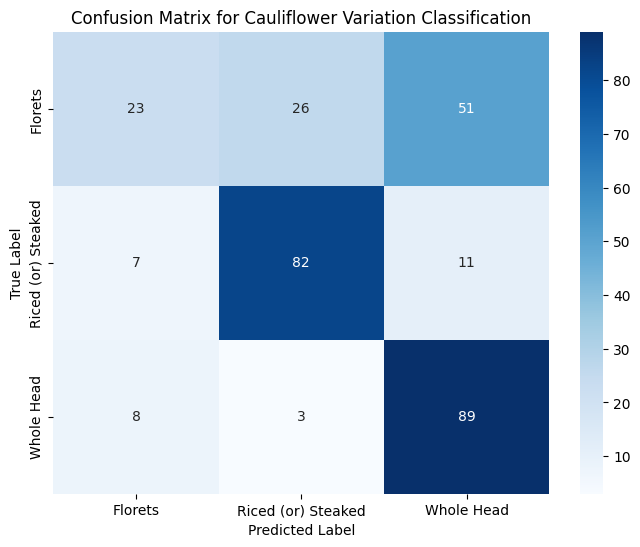

Evaluating variation model for Plum
Found 300 validated image filenames belonging to 3 classes.


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


10/10 ━━━━━━━━━━━━━━━━━━━━ 153s 16s/step

Classification Report for Plum Variation Classification:
                    precision    recall  f1-score   support

Halved (or) Pitted       0.65      0.56      0.60       100
         In a Bowl       0.63      0.80      0.70       100
             Whole       0.55      0.48      0.51       100

          accuracy                           0.61       300
         macro avg       0.61      0.61      0.61       300
      weighted avg       0.61      0.61      0.61       300



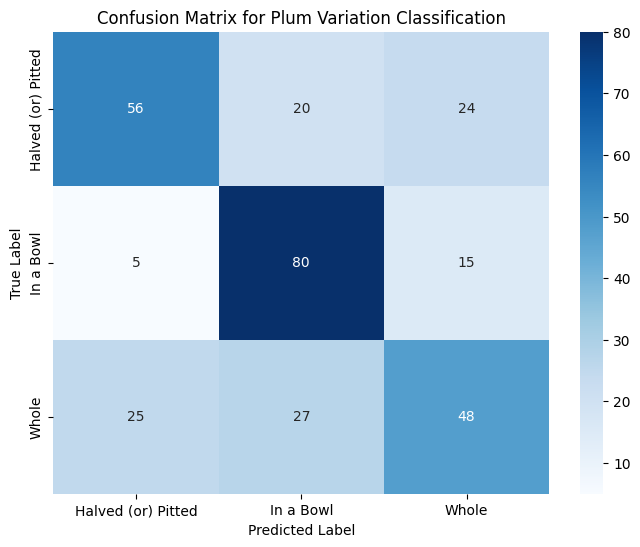

Evaluating variation model for Corn
Found 300 validated image filenames belonging to 3 classes.


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


10/10 ━━━━━━━━━━━━━━━━━━━━ 87s 9s/step

Classification Report for Corn Variation Classification:
              precision    recall  f1-score   support

      Husked       0.56      0.63      0.59       100
     Kernels       0.68      0.62      0.65       100
   Un-Husked       0.69      0.66      0.67       100

    accuracy                           0.64       300
   macro avg       0.64      0.64      0.64       300
weighted avg       0.64      0.64      0.64       300



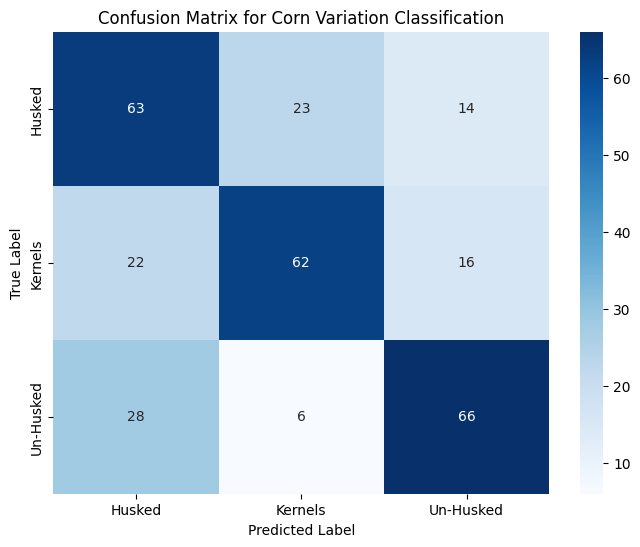

Evaluating variation model for Ginger
Found 300 validated image filenames belonging to 3 classes.


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


10/10 ━━━━━━━━━━━━━━━━━━━━ 85s 9s/step

Classification Report for Ginger Variation Classification:
               precision    recall  f1-score   support

Broken-Peeled       0.51      0.43      0.46       100
Minced-Sliced       0.56      0.64      0.60       100
   Whole-Hand       0.63      0.63      0.63       100

     accuracy                           0.57       300
    macro avg       0.56      0.57      0.56       300
 weighted avg       0.56      0.57      0.56       300



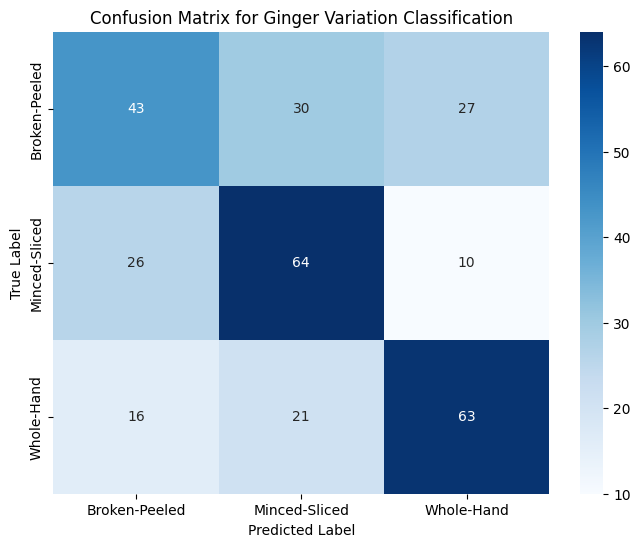

In [77]:
for produce_type, model in variation_models.items():
  print(f"Evaluating variation model for {produce_type}")

  test_df_filtered = test_df[test_df['produce_type'] == produce_type]
  produce_variations = sorted(test_df_filtered['variation'].unique())

  test_generator_variation = val_test_datagen.flow_from_dataframe(
      dataframe=test_df_filtered,
      directory=None, # image_path is absolute
      x_col='image_path',
      y_col='variation',
      target_size=(img_width, img_height),
      batch_size=batch_size,
      class_mode='categorical',
      shuffle=False,
      classes=produce_variations
    )

  # Predict probabilities for the test set using the trained model
  y_pred_probs = model.predict(test_generator_variation)
  y_pred = np.argmax(y_pred_probs, axis=1)

  # Get true labels from the test generator
  y_true = test_generator_variation.classes

  # Generate and print classification report
  print(f"\nClassification Report for {produce_type} Variation Classification:")
  print(classification_report(y_true, y_pred, target_names=produce_variations))

  # Generate confusion matrix
  cm = confusion_matrix(y_true, y_pred)

  # Plot confusion matrix
  plt.figure(figsize=(8, 6))
  sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
              xticklabels=produce_variations,
              yticklabels=produce_variations)
  plt.title(f'Confusion Matrix for {produce_type} Variation Classification')
  plt.ylabel('True Label')
  plt.xlabel('Predicted Label')
  plt.show()

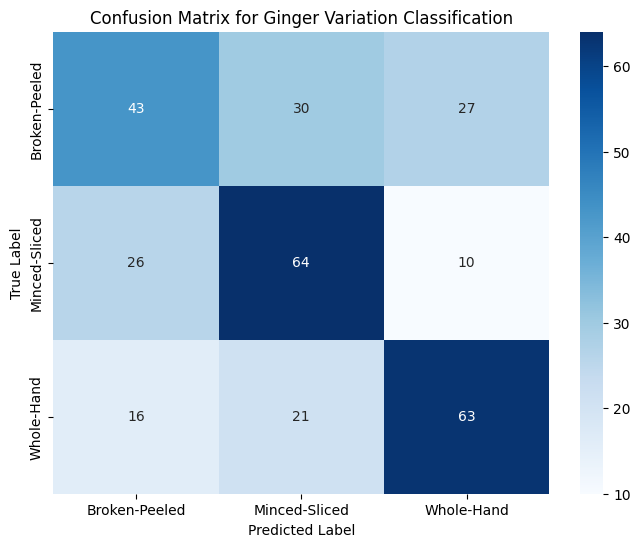

In [78]:
# Generate confusion matrix
cm = confusion_matrix(y_true, y_pred)

# Plot confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=produce_variations,
                yticklabels=produce_variations)
plt.title(f'Confusion Matrix for {produce_type} Variation Classification')
plt.ylabel('True Label')
plt.xlabel('Predicted Label')
plt.show()

## Model Interpretability

In [99]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing import image
from tensorflow.keras.models import Model
import cv2 # Using OpenCV for image manipulation
import os
import pandas as pd


Proceeding with Grad-CAM for trained variation models.

Generating Grad-CAM for produce type: Cauliflower
Identified last convolutional layer: conv5_block3_3_conv
Found 300 validated image filenames belonging to 3 classes.
Class names for Cauliflower: ['Florets', 'Riced (or) Steaked', 'Whole Head']

Generating Grad-CAM heatmaps for 5 sample images from the test set for Cauliflower:
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step

Image: image_0350.jpg
True Variation: Whole Head
Predicted Variation: Whole Head (Confidence: 0.68)
Prediction Status: Correct


/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['input_layer_6']
Received: inputs=Tensor(shape=(1, 150, 150, 3))
  warnings.warn(msg)


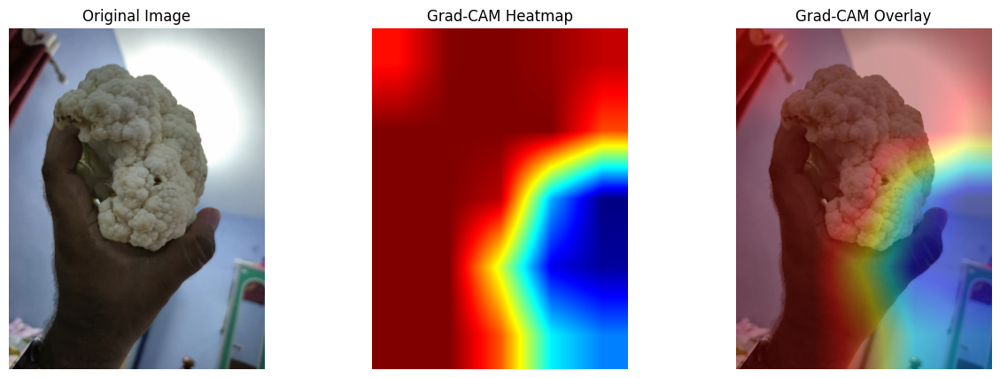

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step

Image: image_0546.jpg
True Variation: Whole Head
Predicted Variation: Whole Head (Confidence: 0.79)
Prediction Status: Correct


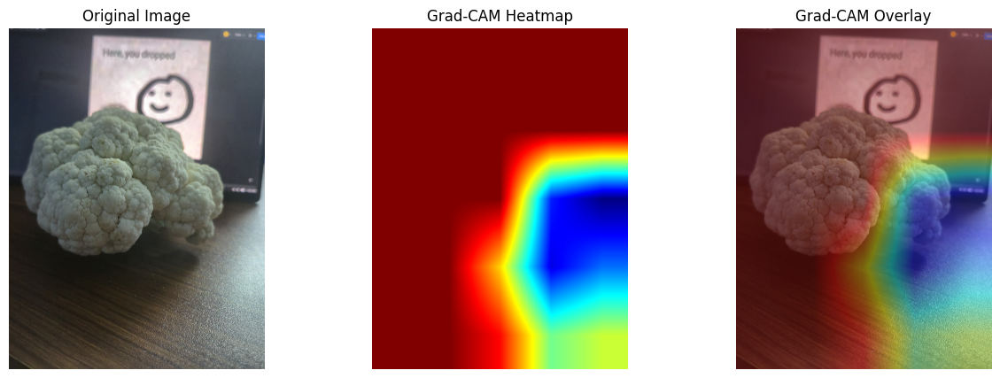

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step

Image: image_0258.jpg
True Variation: Florets
Predicted Variation: Florets (Confidence: 0.44)
Prediction Status: Correct


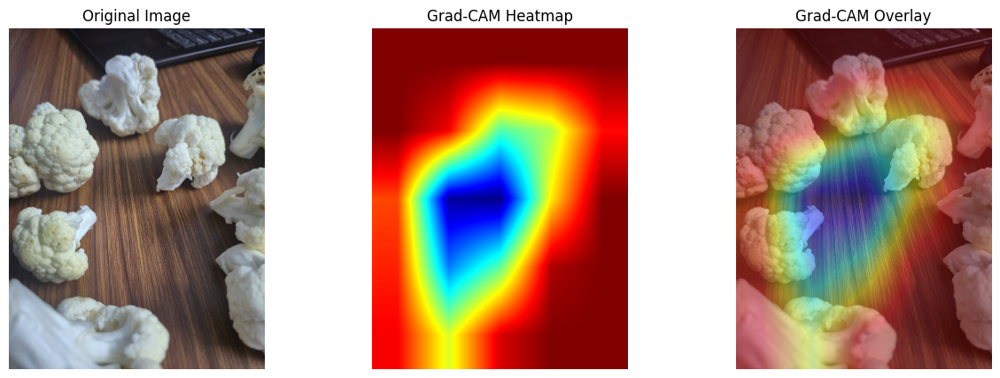

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step

Image: image_0252.jpg
True Variation: Florets
Predicted Variation: Whole Head (Confidence: 0.54)
Prediction Status: Incorrect


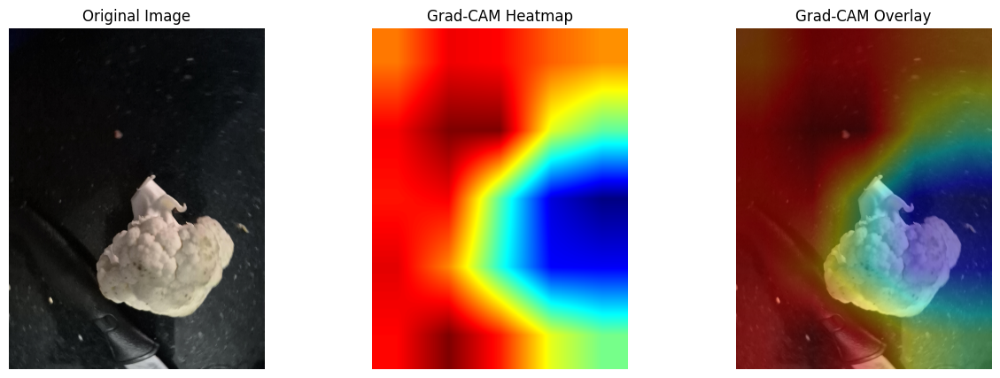

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step

Image: image_0211.jpg
True Variation: Whole Head
Predicted Variation: Riced (or) Steaked (Confidence: 0.48)
Prediction Status: Incorrect


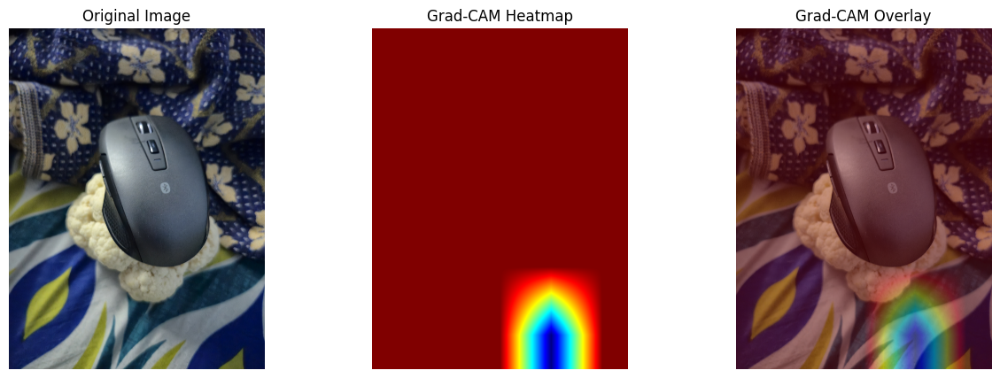


Generating Grad-CAM for produce type: Plum
Identified last convolutional layer: conv5_block3_3_conv
Found 300 validated image filenames belonging to 3 classes.
Class names for Plum: ['Halved (or) Pitted', 'In a Bowl', 'Whole']

Generating Grad-CAM heatmaps for 5 sample images from the test set for Plum:
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step

Image: image_0221.jpg
True Variation: In a Bowl
Predicted Variation: In a Bowl (Confidence: 0.95)
Prediction Status: Correct


/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['input_layer_7']
Received: inputs=Tensor(shape=(1, 150, 150, 3))
  warnings.warn(msg)


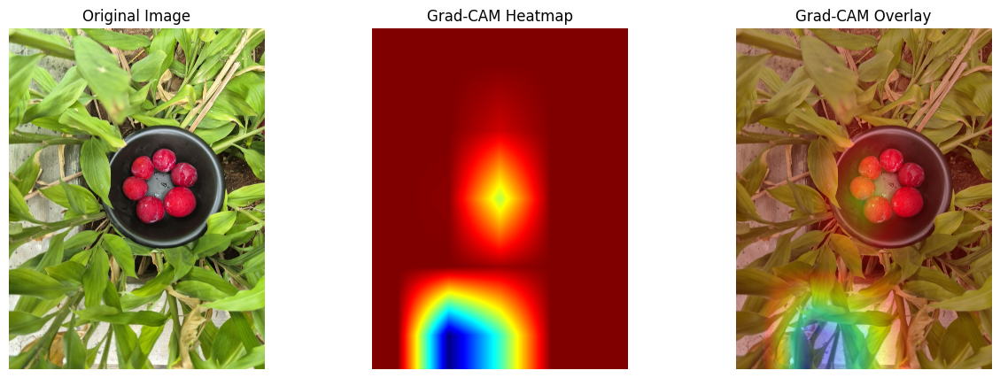

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step

Image: image_0417.jpg
True Variation: Whole
Predicted Variation: Halved (or) Pitted (Confidence: 0.60)
Prediction Status: Incorrect


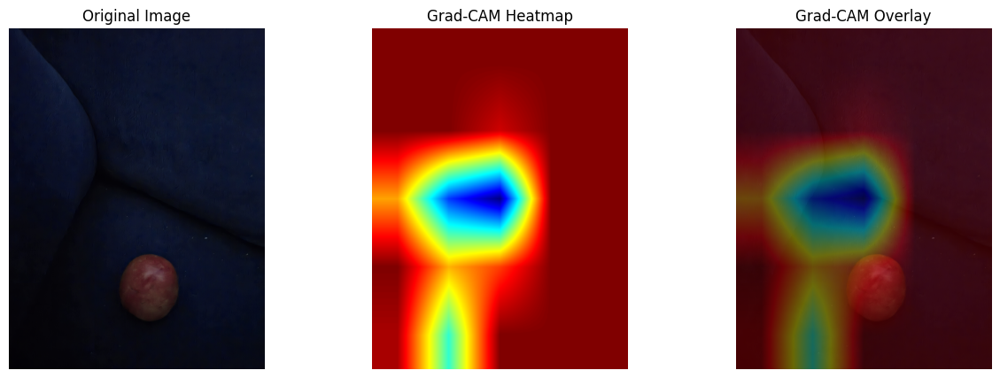

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step

Image: image_0229.jpg
True Variation: Halved (or) Pitted
Predicted Variation: Halved (or) Pitted (Confidence: 0.38)
Prediction Status: Correct


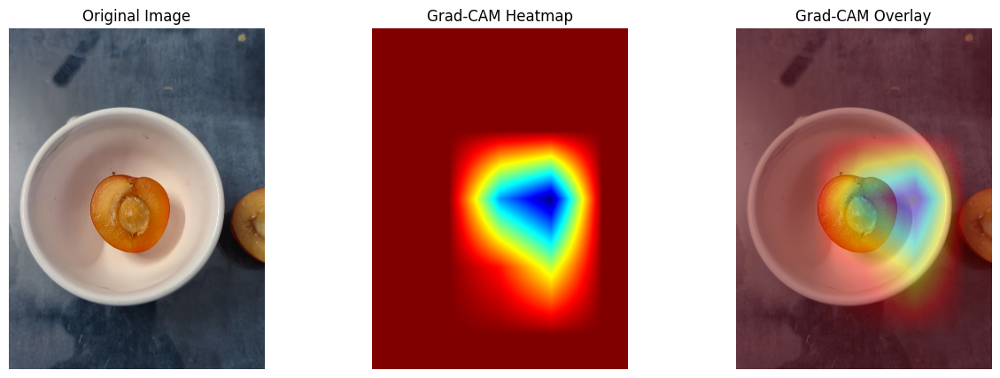

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step

Image: image_0001.jpg
True Variation: Whole
Predicted Variation: In a Bowl (Confidence: 0.66)
Prediction Status: Incorrect


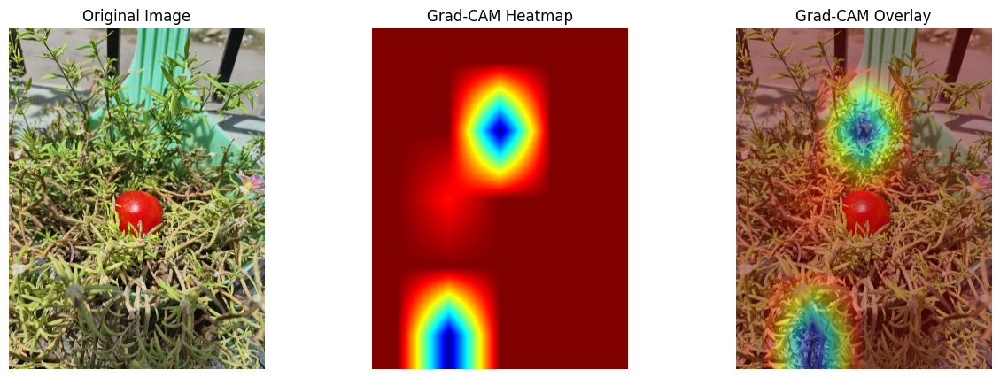

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step

Image: image_0131.jpg
True Variation: Halved (or) Pitted
Predicted Variation: Halved (or) Pitted (Confidence: 0.42)
Prediction Status: Correct


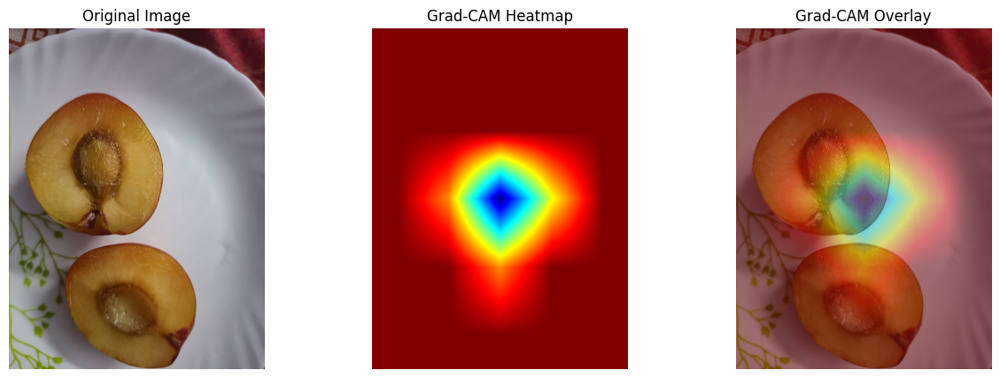


Generating Grad-CAM for produce type: Corn
Identified last convolutional layer: conv5_block3_3_conv
Found 300 validated image filenames belonging to 3 classes.
Class names for Corn: ['Husked', 'Kernels', 'Un-Husked']

Generating Grad-CAM heatmaps for 5 sample images from the test set for Corn:
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step

Image: image_0733.JPG
True Variation: Kernels
Predicted Variation: Un-Husked (Confidence: 0.73)
Prediction Status: Incorrect


/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['input_layer_8']
Received: inputs=Tensor(shape=(1, 150, 150, 3))
  warnings.warn(msg)


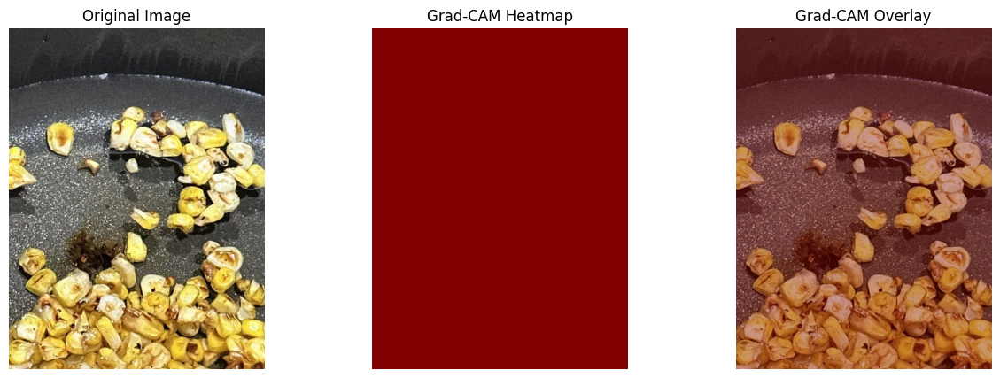

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step

Image: image_0279.JPG
True Variation: Kernels
Predicted Variation: Kernels (Confidence: 0.67)
Prediction Status: Correct


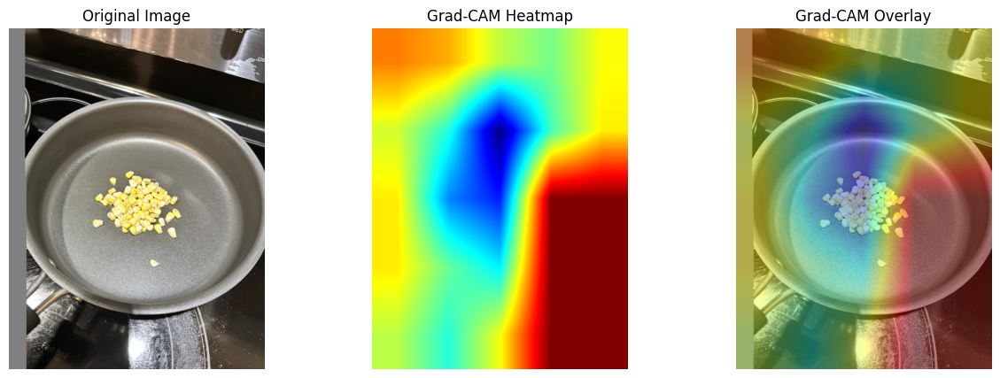

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step

Image: image_0149.JPG
True Variation: Un-Husked
Predicted Variation: Un-Husked (Confidence: 0.46)
Prediction Status: Correct


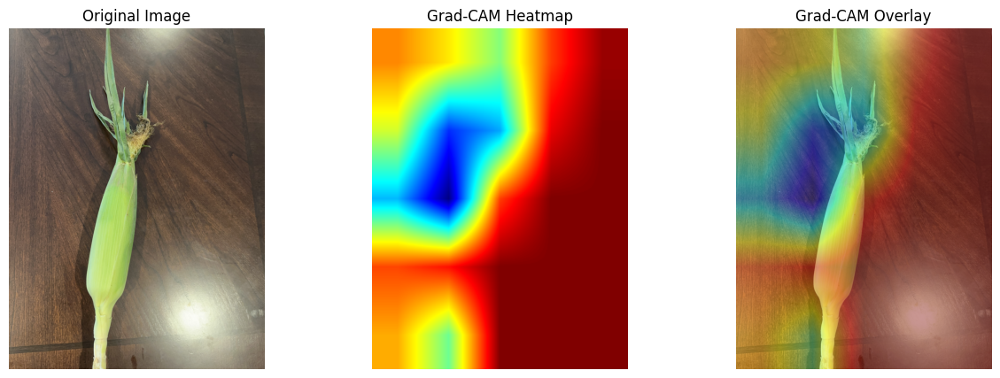

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step

Image: image_0687.JPG
True Variation: Husked
Predicted Variation: Husked (Confidence: 0.53)
Prediction Status: Correct


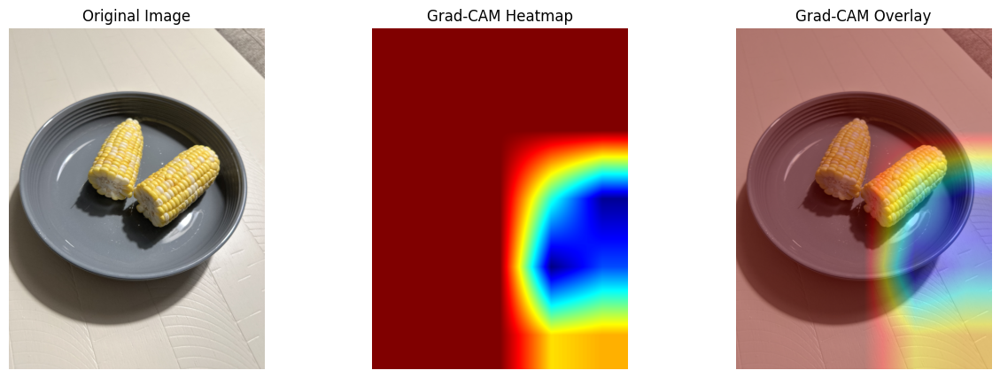

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step

Image: image_0327.JPG
True Variation: Kernels
Predicted Variation: Un-Husked (Confidence: 0.58)
Prediction Status: Incorrect


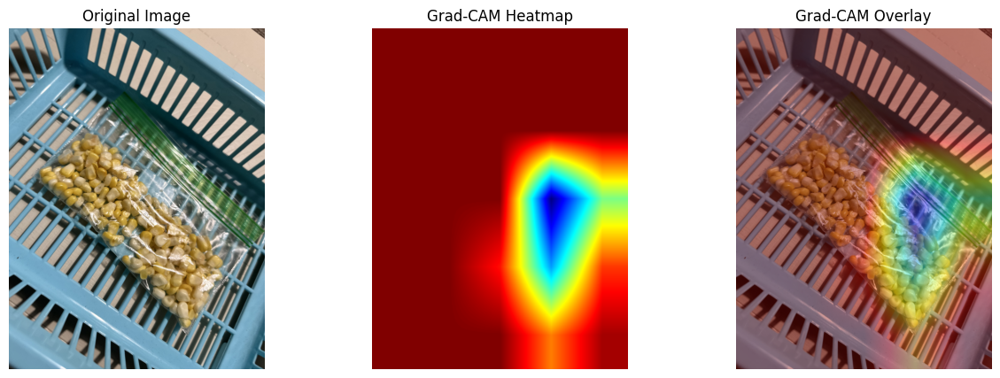


Generating Grad-CAM for produce type: Ginger
Identified last convolutional layer: conv5_block3_3_conv
Found 300 validated image filenames belonging to 3 classes.
Class names for Ginger: ['Broken-Peeled', 'Minced-Sliced', 'Whole-Hand']

Generating Grad-CAM heatmaps for 5 sample images from the test set for Ginger:
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step

Image: image_0704.JPG
True Variation: Whole-Hand
Predicted Variation: Whole-Hand (Confidence: 0.51)
Prediction Status: Correct


/usr/local/lib/python3.11/dist-packages/keras/src/models/functional.py:237: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: ['input_layer_9']
Received: inputs=Tensor(shape=(1, 150, 150, 3))
  warnings.warn(msg)


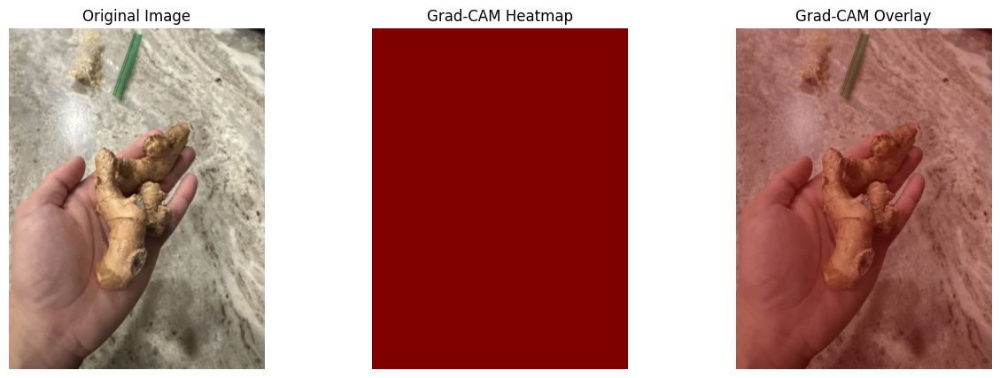

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step

Image: image_0158.JPG
True Variation: Whole-Hand
Predicted Variation: Whole-Hand (Confidence: 0.38)
Prediction Status: Correct


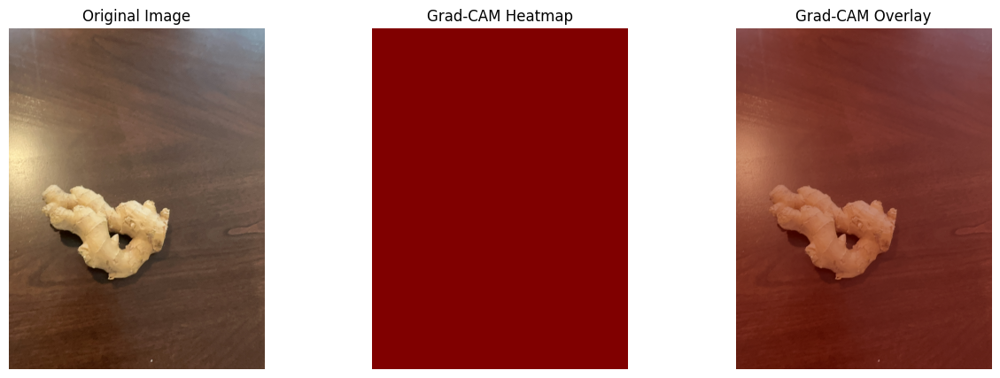

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step

Image: image_0319.JPG
True Variation: Minced-Sliced
Predicted Variation: Minced-Sliced (Confidence: 0.40)
Prediction Status: Correct


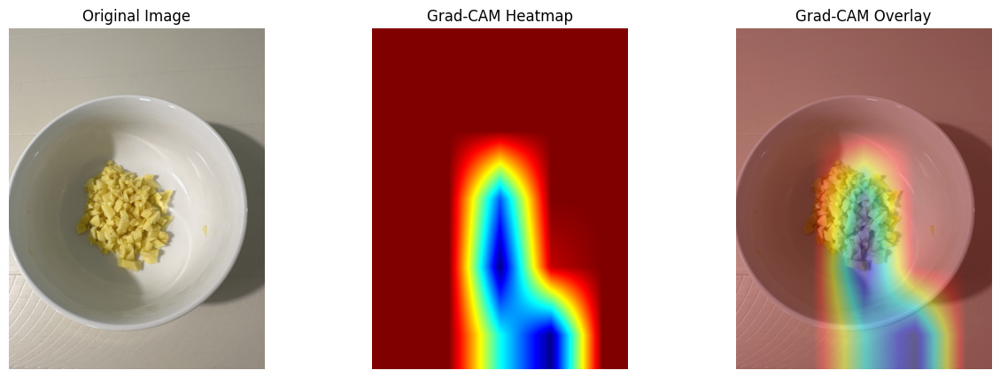

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step

Image: image_0203.JPG
True Variation: Broken-Peeled
Predicted Variation: Broken-Peeled (Confidence: 0.42)
Prediction Status: Correct


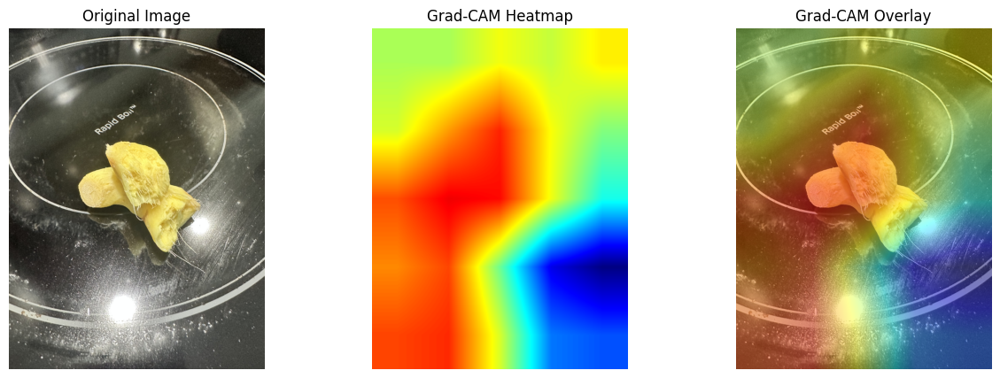

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step

Image: image_0546.JPG
True Variation: Whole-Hand
Predicted Variation: Whole-Hand (Confidence: 0.34)
Prediction Status: Correct


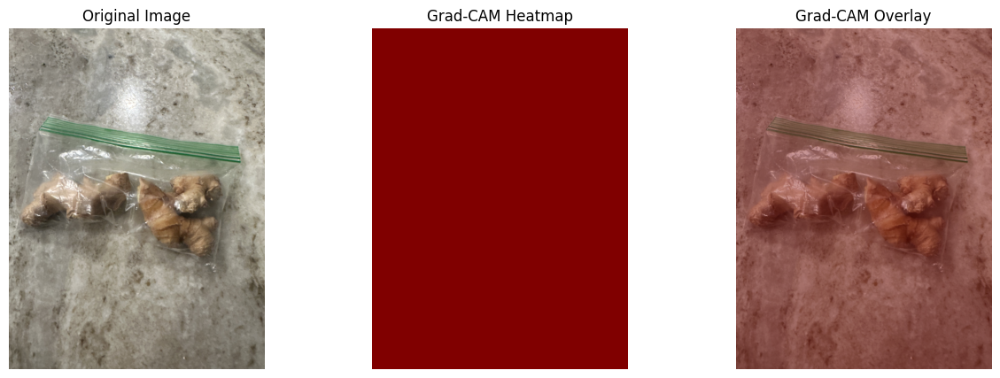

In [100]:
# Helper function to get the last convolutional layer of a model
def find_last_conv_layer(model):
  for layer in reversed(model.layers):
    if hasattr(layer, 'filters') and hasattr(layer, 'kernel_initializer'):
      if not isinstance(layer, tf.keras.layers.SeparableConv2D):
        return layer.name
      if isinstance(layer, tf.keras.layers.DepthwiseConv2D):
        return layer.name
  return None

# Function to generate Grad-CAM heatmap
def make_gradcam_heatmap(img_array, model, last_conv_layer_name, pred_index=None):
  try:
    grad_model = Model(
        model.inputs, [model.get_layer(last_conv_layer_name).output, model.output])

  except ValueError as e:
    print(f"Error creating grad_model: {e}")
    print(f"Last conv layer name: {last_conv_layer_name}")
    print("Available layers in the model:")
    for layer in model.layers:
      print(layer.name)
    raise

  with tf.GradientTape() as tape:
    last_conv_layer_output, predictions = grad_model(img_array)
    if pred_index is None:
      pred_index = tf.argmax(predictions[0])

    if pred_index >= predictions.shape[-1] or pred_index < 0:
      raise IndexError("Predicted index out of bounds")
    class_channel = predictions[:, pred_index]

  grads = tape.gradient(class_channel, last_conv_layer_output)

  if grads is None:
      print(f"Error: Gradients are None for layer {last_conv_layer_name}. Ensure the layer is trainable or part of the computation graph leading to the output.")
      return None

  pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

  last_conv_layer_output = last_conv_layer_output[0]
  if last_conv_layer_output.shape[-1] != pooled_grads.shape[-1]:
       print(f"Error: Mismatch in dimensions: last_conv_layer_output shape {last_conv_layer_output.shape}, pooled_grads shape {pooled_grads.shape}")
       return None

  heatmap = last_conv_layer_output @ pooled_grads[..., tf.newaxis]
  heatmap = tf.squeeze(heatmap)

  heatmap = tf.maximum(heatmap, 0) / (tf.math.reduce_max(heatmap) + tf.keras.backend.epsilon())
  return heatmap.numpy()

# Function to display Grad-CAM heatmap
def display_gradcam(img_path, heatmap, alpha=0.4):
    """Displays the original image with the Grad-CAM heatmap overlay."""
    img = cv2.imread(img_path)
    if img is None:
        print(f"Error: Could not load image from {img_path}")
        return
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    if not isinstance(heatmap, np.ndarray) or not np.isfinite(heatmap).all():
         print("Error: Invalid heatmap data.")
         return

    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]), interpolation=cv2.INTER_LINEAR)

    heatmap = np.uint8(255 * heatmap)
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

    superimposed_img = cv2.addWeighted(img.astype(np.float32), 1 - alpha, heatmap.astype(np.float32), alpha, 0)
    superimposed_img = np.uint8(superimposed_img)

    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    axes[0].imshow(img)
    axes[0].set_title("Original Image")
    axes[0].axis('off')

    axes[1].imshow(heatmap)
    axes[1].set_title("Grad-CAM Heatmap")
    axes[1].axis('off')

    axes[2].imshow(superimposed_img)
    axes[2].set_title("Grad-CAM Overlay")
    axes[2].axis('off')

    plt.show()

# Use the variation_models dictionary that was populated during training
if not variation_models:
  print("\nNo variation models were trained. Cannot proceed with Grad-CAM.")

else:
  print("\nProceeding with Grad-CAM for trained variation models.")
  for produce_type_to_interpret, model_to_interpret in variation_models.items():
    print(f"\nGenerating Grad-CAM for produce type: {produce_type_to_interpret}")

    # Find the name of the last convolutional layer in the model
    last_conv_layer_name = find_last_conv_layer(model_to_interpret)
    if last_conv_layer_name is None:
        print("Error: Could not find a convolutional layer in the model.")
        continue # Skip to the next produce type if no conv layer found

    print(f"Identified last convolutional layer: {last_conv_layer_name}")

    # Get the class names (variations) for this model
    test_df_filtered_for_gradcam = test_df[test_df['produce_type'] == produce_type_to_interpret].copy()

    if test_df_filtered_for_gradcam.empty:
        print(f"No test images found for {produce_type_to_interpret}. Skipping Grad-CAM.")
        continue

    temp_generator = val_test_datagen.flow_from_dataframe(
        dataframe=test_df_filtered_for_gradcam,
        directory=None,
        x_col='image_path',
        y_col='variation',
        target_size=(img_width, img_height),
        batch_size=1,
        class_mode='categorical',
        shuffle=False
    )
    class_names = list(temp_generator.class_indices.keys())
    print(f"Class names for {produce_type_to_interpret}: {class_names}")

    # Choose a few test images - removed random_state to get different samples each time
    sample_images_df = test_df_filtered_for_gradcam.sample(n=min(5, len(test_df_filtered_for_gradcam)))

    print(f"\nGenerating Grad-CAM heatmaps for {len(sample_images_df)} sample images from the test set for {produce_type_to_interpret}:")

    # Generate, Overlay, and Analyze Heatmaps
    for index, row in sample_images_df.iterrows():
      img_path = row['image_path']
      true_variation = row['variation']

      # Load and preprocess the image
      try:
        img = image.load_img(img_path, target_size=(img_width, img_height))
        img_array = image.img_to_array(img)
        img_array = np.expand_dims(img_array, axis=0)
        img_array = img_array / 255.0
      except Exception as e:
        print(f"Error loading or preprocessing image {img_path}: {e}")
        continue

      # Predict the class
      try:
          predictions = model_to_interpret.predict(img_array)
          predicted_class_index = np.argmax(predictions[0])

          if predicted_class_index < 0 or predicted_class_index >= len(class_names):
               print(f"Warning: Predicted class index {predicted_class_index} is out of range for class names ({len(class_names)}).")
               predicted_variation = "Unknown"
          else:
              predicted_variation = class_names[predicted_class_index]

          confidence = predictions[0][predicted_class_index] if 0 <= predicted_class_index < len(predictions[0]) else 0.0

          print(f"\nImage: {os.path.basename(img_path)}")
          print(f"True Variation: {true_variation}")
          print(f"Predicted Variation: {predicted_variation} (Confidence: {confidence:.2f})")
          print(f"Prediction Status: {'Correct' if true_variation == predicted_variation else 'Incorrect'}")

          target_pred_index = predicted_class_index

          if 0 <= target_pred_index < predictions.shape[-1]:
               heatmap = make_gradcam_heatmap(img_array, model_to_interpret, last_conv_layer_name, pred_index=target_pred_index)

               if heatmap is not None:
                   display_gradcam(img_path, heatmap)

               else:
                   print(f"Skipping heatmap display for {img_path} due to error during generation.")
          else:
               print(f"Skipping heatmap generation for {img_path}: Invalid target prediction index {target_pred_index}.")

      except Exception as e:
          print(f"Error during prediction or heatmap generation for {img_path}: {e}")
          continue

In [101]:
import pickle

# Architecture + weights → Pickle
pkl_path = "produce_type_model.pkl"

model_serial = {
    "config" : best_produce_type_model.to_json(), # model blueprint
    "weights": best_produce_type_model.get_weights() # numpy arrays
}

with open(pkl_path, "wb") as fh:
    pickle.dump(model_serial, fh)

print(f"Pickled model config & weights to {pkl_path}")

Pickled model config & weights to produce_type_model.pkl


In [102]:
import pickle
import os

# Assuming variation_models dictionary is populated from the training process

if 'variation_models' in locals() and variation_models:
    print("Collecting and saving all variation model weights and configs to a single Pickle file...")

    all_variation_models_serial = {}

    for produce_type, model in variation_models.items():
        try:
            model_serial = {
                "config" : model.to_json(),        # model blueprint
                "weights": model.get_weights()    # numpy arrays
            }
            all_variation_models_serial[produce_type] = model_serial
            print(f"Collected config and weights for {produce_type} variation model.")

        except Exception as e:
             print(f"Error collecting config and weights for {produce_type} variation model: {e}")


    # Persist all variation model data to a single Pickle file
    pkl_path = "produce_variation_model.pkl"
    try:
        with open(pkl_path, "wb") as fh:
            pickle.dump(all_variation_models_serial, fh)
        print(f"Pickled all variation model data to {pkl_path}")
    except Exception as e:
         print(f"Error pickling all variation model data: {e}")

else:
    print("Variable 'variation_models' not found or is empty. Please train the variation models first.")

Collected config and weights for Cauliflower variation model.
Collected config and weights for Plum variation model.
Collected config and weights for Corn variation model.
Collected config and weights for Ginger variation model.
Pickled all variation model data to produce_variation_model.pkl


In [103]:
import tensorflow as tf
import os

# Save Produce Type Model
if 'best_produce_type_model' in locals():
    h5_path_produce = "produce_type_model.h5"
    try:
        best_produce_type_model.save(h5_path_produce)
        print(f"Saved produce type model to {h5_path_produce}")
    except Exception as e:
        print(f"Error saving produce type model to HDF5: {e}")

# Save Variation Models
if 'variation_models' in locals() and variation_models:
    print("\nSaving variation models to individual .h5 files...")
    for produce_type, model in variation_models.items():
        # Sanitize produce_type for filenames
        safe_produce_type = produce_type.replace(" ", "_").replace("(", "").replace(")", "")
        h5_path_variation = f"{safe_produce_type}_variation_model.h5"
        try:
            model.save(h5_path_variation)
            print(f"Saved {produce_type} variation model to {h5_path_variation}")
        except Exception as e:
            print(f"Error saving {produce_type} variation model to HDF5: {e}")
else:
    print("Variable 'variation_models' not found or is empty. Skipping variation model saving.")

Saved produce type model to produce_type_model.h5

Saving variation models to individual .h5 files...


Saved Cauliflower variation model to Cauliflower_variation_model.h5


Saved Plum variation model to Plum_variation_model.h5


Saved Corn variation model to Corn_variation_model.h5
Saved Ginger variation model to Ginger_variation_model.h5
